In [1]:
#! /usr/bin/python3
""" 01 - Generative Adversarial Networks (GAN) for CIFAR-10.

Using generative adversarial networks (GAN) to generate random images from a
noise distribution.

References:
    - [CS231n Convolutional Neural Networks for Visual Recognition](http://cs231n.github.io/convolutional-networks/)
    - [Generative Adversarial Networks (LIVE) - Siraj Raval](https://www.youtube.com/watch?v=0VPQHbMvGzg)
    - [Deep Convolutional Generative Adversarial Network Example](https://github.com/aymericdamien/TensorFlow-Examples/blob/master/notebooks/3_NeuralNetworks/dcgan.ipynb)
    - [m516825 - Conditional-GAN](https://github.com/m516825/Conditional-GAN)
    - [GanHacks](https://github.com/soumith/ganhacks)
    
Author: Paweł Kubiak
"""

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt #visualize results
from tqdm import tqdm
%matplotlib inline
# plt.rcParams['figure.figsize'] = (20,10)

BATCH_SIZE = 64
LABEL_SIZE = 10
NOISE_SIZE = 300

In [2]:
# Import CIFAR10 data
from cifar10 import load_data

cifar10_x, cifar10_y = load_data()
cifar10_x = 2.0 * cifar10_x - 1.0 # scale to [-1,1]
cifar10_idx = 0

def get_data():
    global cifar10_x, cifar10_y, cifar10_idx
    if cifar10_idx + BATCH_SIZE > cifar10_x.shape[0]:
        perm = np.random.permutation(cifar10_x.shape[0])
        cifar10_x = cifar10_x[perm]
        cifar10_y = cifar10_y[perm]
        cifar10_idx = 0
    batch_x = cifar10_x[cifar10_idx:cifar10_idx+BATCH_SIZE]
    batch_y = cifar10_y[cifar10_idx:cifar10_idx+BATCH_SIZE]
    cifar10_idx += BATCH_SIZE
    
    return batch_x, batch_y

In [3]:
# Build discriminator network
def discriminator(input, labels, reuse = False):
    with tf.variable_scope('discriminator', reuse = reuse):
        # Convolution Layer #1: (x, 32, 32, 3)
        conv1 = tf.layers.conv2d(input, 32, 5, padding= 'SAME')
        conv1 = tf.layers.batch_normalization(conv1, training = is_training)
        conv1 = tf.nn.leaky_relu(conv1)
        conv1 = tf.layers.average_pooling2d(conv1, 2, 2, padding = 'SAME')
        
        # Add labels: (x, 16, 16, 32) -> (x, 16, 16, 42)
        labels = tf.expand_dims(tf.expand_dims(labels, 1), 2)
        labels = tf.tile(labels, [1, 16, 16, 1])
        labels = tf.concat([conv1, labels], 3)
        
        # Convolution Layer #2: (x, 16, 16, 42) -> (x, 8, 8, 84)
        conv2 = tf.layers.conv2d(labels, 84, 5, padding= 'SAME')
        conv2 = tf.layers.batch_normalization(conv2, training = is_training)
        conv2 = tf.nn.leaky_relu(conv2)
        conv2 = tf.layers.average_pooling2d(conv2, 2, 2, padding = 'SAME')

        # Convolution Layer #3: (x, 8, 8, 84) -> (x, 4, 4, 168)
        conv3 = tf.layers.conv2d(conv2, 168, 5, padding= 'SAME')
        conv3 = tf.layers.batch_normalization(conv3, training = is_training)
        conv3 = tf.nn.leaky_relu(conv3)
        conv3 = tf.layers.average_pooling2d(conv3, 2, 2, padding = 'SAME')

        # Fully Connected Layer #2 -> return 2 label: FAKE, REAL
        full1 = tf.reshape(conv3, [conv3.shape[0], -1])
        full1 = tf.layers.dense(full1, 2)
        
        return full1

In [4]:
# Incorporated from https://github.com/Tetrachrome/subpixel
def phase_shift(I, r):
    b, w, h, c = I.get_shape().as_list()
    X = tf.reshape(I, (b, w, h, r, r, c//(r*r))) # -> (b, r*w, h*w, c/(r*r))
    X = tf.split(X, w, 1) # (b, 1, h, r, r, c/rr) * w
    X = tf.concat(X, 3) # (b, 1, h, w*r, r, c/rr)
    X = tf.squeeze(X) # (b, h, w*r, r, c/rr)
    X = tf.split(X, h, 1) # (b, 1, w*r, r, c/rr) * h
    X = tf.concat(X, 3) # (b, 1, w*r, h*r, c/rr)
    X = tf.squeeze(X) # (b, w*r, h*r, c/rr)
    return X

def _phase_shift(I, r):
    # Helper function with main phase shift operation
    bsize, a, b, c = I.get_shape().as_list()
    X = tf.reshape(I, (bsize, a, b, r, r))
    X = tf.transpose(X, (0, 1, 2, 4, 3))  # bsize, a, b, 1, 1
    X = tf.split(X, a, 1)  # a, [bsize, b, r, r]
    X = tf.concat(2, [tf.squeeze(x) for x in X])  # bsize, b, a*r, r
    X = tf.split(X, b, 1)  # b, [bsize, a*r, r]
    X = tf.concat(2, [tf.squeeze(x) for x in X])  # bsize, a*r, b*r
    return tf.reshape(X, (bsize, a*r, b*r, 1))


In [5]:
# Build generator network
def generator(noise, labels):
    with tf.variable_scope('generator', reuse = tf.AUTO_REUSE):
        input = tf.concat([noise, labels], axis = 1)
        
        full1 = tf.layers.dense(input, units = 4 * 4 * 256)
        full1 = tf.layers.batch_normalization(full1, training = is_training)
        full1 = tf.nn.leaky_relu(full1)

        full1 = tf.reshape(full1, [-1, 4, 4, 256])

        # Deconvolution #1: (x, 4, 4, 256) -> (x, 8, 8, 128)
        deconv1 = tf.layers.conv2d_transpose(full1, 128, 5, strides=2, padding = 'SAME')
        deconv1 = tf.layers.batch_normalization(deconv1, training = is_training)
        deconv1 = tf.nn.leaky_relu(deconv1)
        deconv1 = tf.layers.dropout(deconv1, 0.2)
        
        # Deconvolution #2: (x, 8, 8, 128) -> (x, 16, 16, 64)
        deconv2 = tf.layers.conv2d_transpose(deconv1, 48, 5, strides = 2, padding = 'SAME')
        deconv2 = tf.layers.batch_normalization(deconv2, training = is_training)
        
        deconv2 = tf.nn.leaky_relu(deconv2)
        deconv2 = tf.layers.dropout(deconv2, 0.1)
        
        # Final Deconvolution: (x, 32, 32, 32) -> (x, 64, 64, 3)        
#         deconv3 = tf.layers.conv2d_transpose(deconv2, 3, 5, strides = 2, padding = 'SAME')
#         subpixel = tf.concat([_phase_shift(x, 4) for x in tf.split(deconv2, 3, axis = 3)])
        subpixel = phase_shift(deconv2, 4)
        print(subpixel)
        # Avg. Pooling : (x, 64, 64, 3) -> (x, 32, 32, 3)
        pool1 = tf.layers.average_pooling2d(subpixel, 2, 2, padding = 'SAME')
        
        return tf.tanh(pool1)

In [14]:
tf.reset_default_graph()
is_training = tf.placeholder('bool', name = 'is_training')

labels = tf.placeholder('float', shape = [BATCH_SIZE, LABEL_SIZE], name = 'labels')
images = tf.placeholder('float', shape = [BATCH_SIZE, 32, 32, 3], name = 'images')
noise = tf.placeholder('float', shape = [BATCH_SIZE, NOISE_SIZE], name = 'noise')

# ones1 = tf.placeholder('float', shape  = [BATCH_SIZE], name = 'ones_1')
# ones2 = tf.placeholder('float', shape  = [BATCH_SIZE], name = 'ones_2')
# zeros1 = tf.placeholder('float', shape  = [BATCH_SIZE], name = 'zeros_1')

# Discriminators
disc_real = discriminator(images, labels)

genn = generator(noise, labels)
print(genn)
disc_fake = discriminator(genn, labels, True)

# Loss functions

gen_loss = tf.reduce_mean(
    tf.nn.sparse_softmax_cross_entropy_with_logits(
        logits = disc_fake,
#         labels = ones1
        labels = tf.ones(dtype=tf.int32, shape = [BATCH_SIZE])
    )
)

disc_loss_real = tf.reduce_mean(
    tf.nn.sparse_softmax_cross_entropy_with_logits(
        logits = disc_real, 
#         labels = ones2
        labels = tf.ones(dtype=tf.int32, shape = [BATCH_SIZE])
    )
)

disc_loss_fake = tf.reduce_mean(
    tf.nn.sparse_softmax_cross_entropy_with_logits(
        logits = disc_fake,
#         labels = zeros1
        labels = tf.zeros(dtype=tf.int32, shape = [BATCH_SIZE])
    )
)

disc_loss = disc_loss_real + disc_loss_fake

Tensor("generator/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)
Tensor("generator/Tanh:0", shape=(64, 32, 32, 3), dtype=float32)


In [15]:
gen_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, scope='generator')
disc_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, scope='discriminator')

# vvvv Magic vvvv - Very important !
with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS, scope='discriminator')):
    d_trainer = tf.train.AdamOptimizer(0.0001).minimize(disc_loss, var_list=disc_vars)

    d_trainer_real = tf.train.AdamOptimizer(0.0001).minimize(disc_loss_real, var_list=disc_vars)
    d_trainer_fake = tf.train.AdamOptimizer(0.0001).minimize(disc_loss_fake, var_list=disc_vars)

with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS, scope='generator')):
    g_trainer = tf.train.AdamOptimizer(0.0001).minimize(gen_loss, var_list=gen_vars)

init = tf.global_variables_initializer()

In [16]:
from resnet import resnet


# Testing
test_inputs = tf.placeholder(tf.float32, shape=(64, 32, 32, 3), name = 'test_inputs')
test_labels = tf.placeholder(tf.int64, shape = (64,), name = 'test_labels')

train_model = resnet(test_inputs, False, True)
test_model = resnet(test_inputs, True, False)
prediction = tf.argmax(tf.nn.softmax(test_model), axis = 1)
correct = tf.equal(prediction, test_labels)
accuracy = tf.reduce_mean(tf.cast(correct, tf.float32))

# print(tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES, scope='resnet'))

saver = tf.train.Saver(tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES, scope='resnet'))


INFO:tensorflow:Restoring parameters from ../00-convnet/0.872400-99.ckpt
CIFAR10 samples:


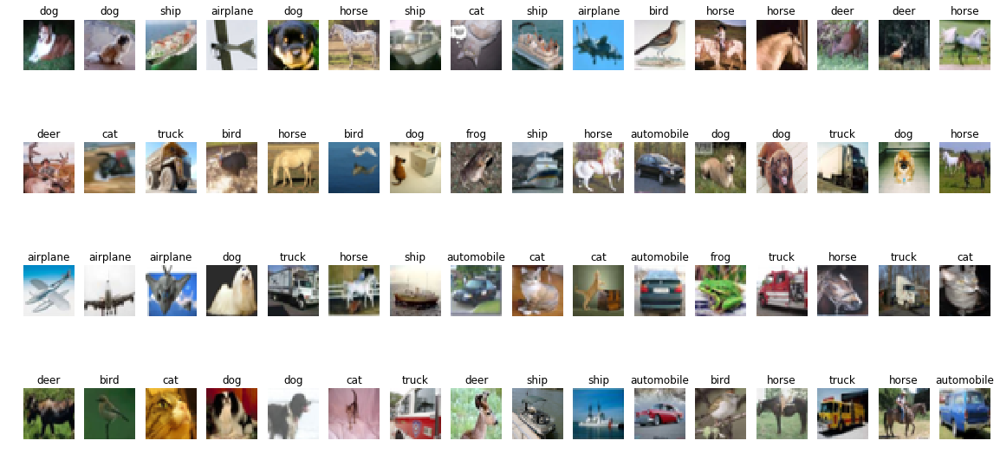


  0%|          | 0/2500 [00:00<?, ?it/s]

quality: 1.0



  2%|▏         | 38/2500 [00:09<09:59,  4.11it/s]
Exception in thread Thread-18:
Traceback (most recent call last):
  File "/usr/lib/python3.5/threading.py", line 914, in _bootstrap_inner
    self.run()
  File "/mnt/storage/users/z1077883/ml/.venv/lib/python3.5/site-packages/tqdm/_tqdm.py", line 144, in run
    for instance in self.tqdm_cls._instances:
  File "/mnt/storage/users/z1077883/ml/.venv/lib/python3.5/_weakrefset.py", line 60, in __iter__
    for itemref in self.data:
RuntimeError: Set changed size during iteration

100%|██████████| 2500/2500 [09:46<00:00,  4.26it/s]


epoch: 1 (2500) dLoss: 0.440605 gLoss: 2.68147 d_count: 4634 g_count: 17061
Tensor("generator_13/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


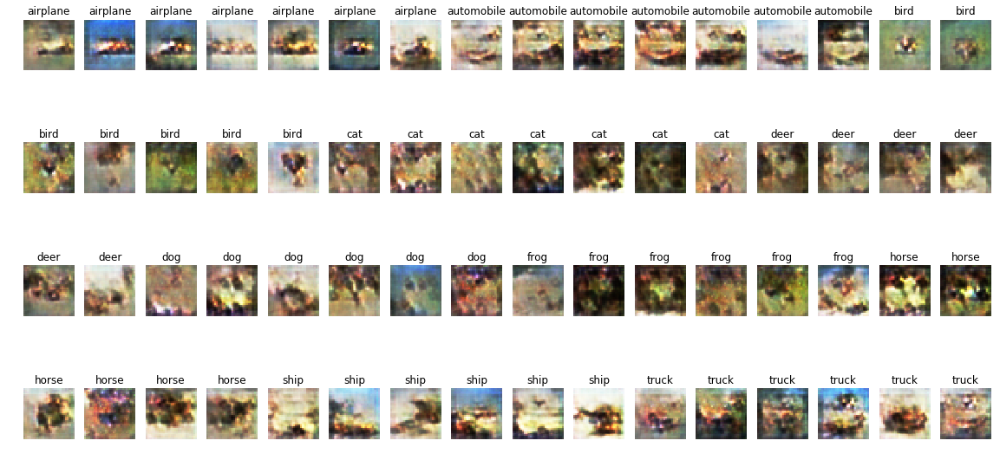

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 23.44%


100%|██████████| 2500/2500 [09:35<00:00,  4.34it/s]


epoch: 2 (5000) dLoss: 0.378026 gLoss: 1.46863 d_count: 6903 g_count: 13574
Tensor("generator_14/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


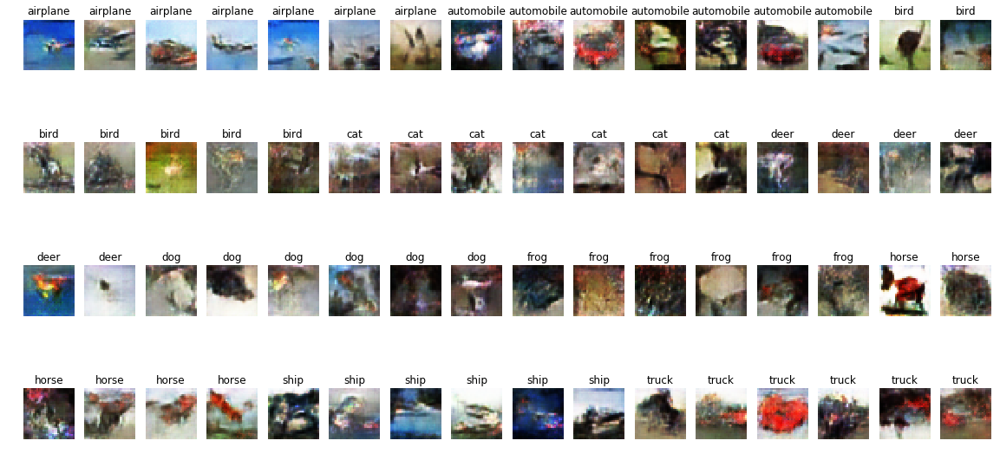

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 32.81%


100%|██████████| 2500/2500 [09:37<00:00,  4.33it/s]


epoch: 3 (7500) dLoss: 0.448107 gLoss: 1.31859 d_count: 6681 g_count: 13933
Tensor("generator_15/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


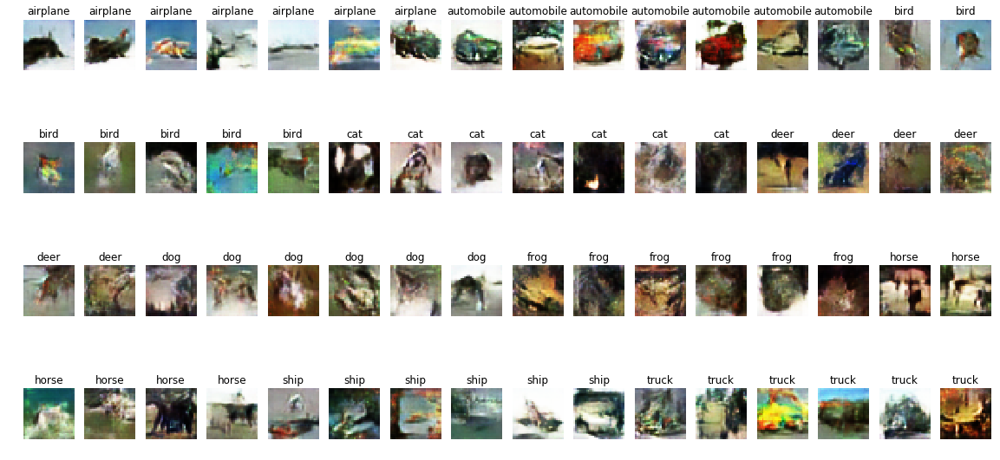

  0%|          | 1/2500 [00:00<04:41,  8.86it/s]

Quality: 35.94%


100%|██████████| 2500/2500 [09:47<00:00,  4.26it/s]


epoch: 4 (10000) dLoss: 0.477618 gLoss: 2.44444 d_count: 6031 g_count: 15197
Tensor("generator_16/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


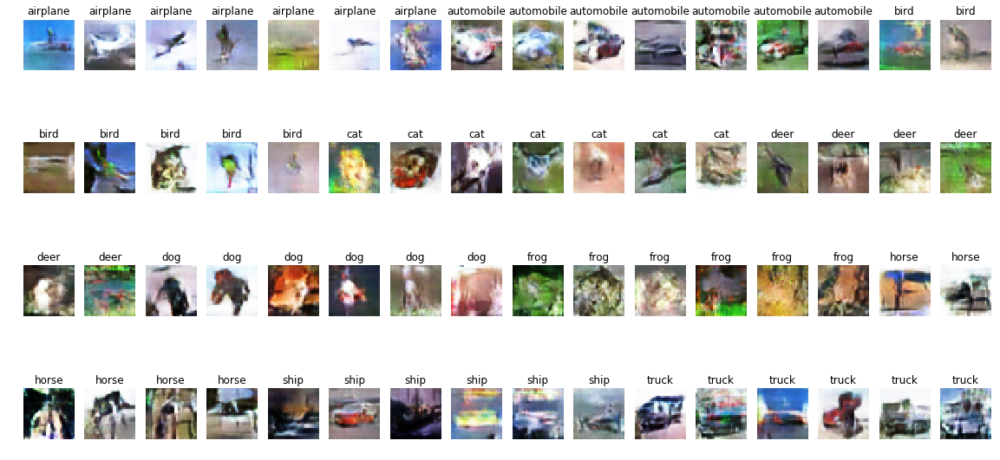

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 40.62%


100%|██████████| 2500/2500 [09:51<00:00,  4.23it/s]


epoch: 5 (12500) dLoss: 0.32194 gLoss: 2.75132 d_count: 5341 g_count: 16307
Tensor("generator_17/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


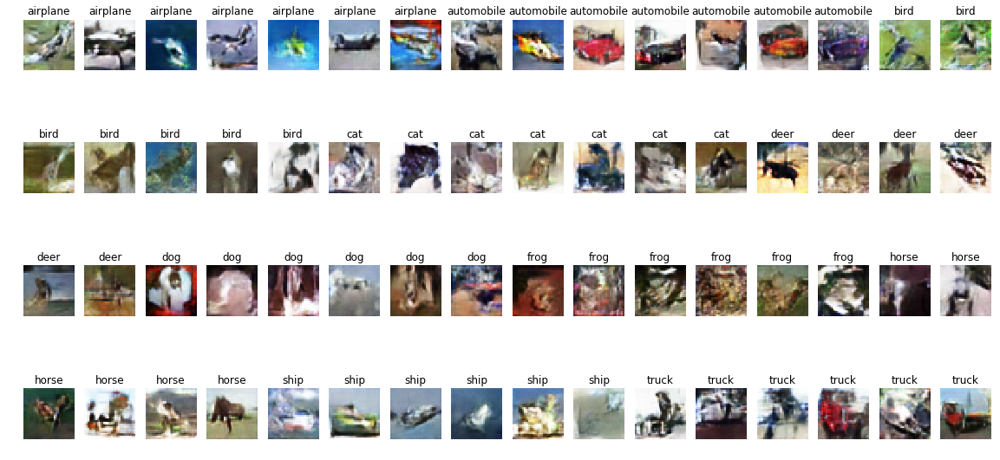

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 48.44%


100%|██████████| 2500/2500 [09:59<00:00,  4.17it/s]


epoch: 6 (15000) dLoss: 0.394135 gLoss: 2.8527 d_count: 5036 g_count: 17036
Tensor("generator_18/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


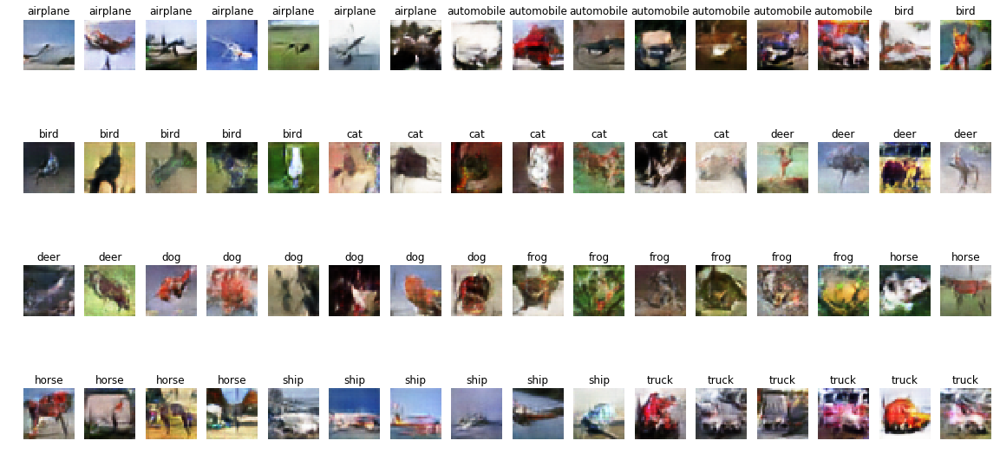

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 53.12%


100%|██████████| 2500/2500 [10:08<00:00,  4.11it/s]


epoch: 7 (17500) dLoss: 0.317769 gLoss: 2.49131 d_count: 5169 g_count: 17227
Tensor("generator_19/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


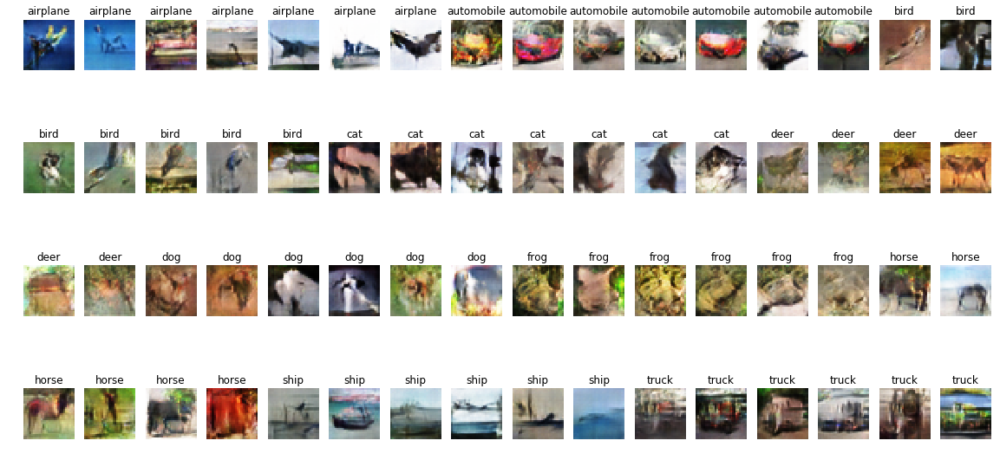

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 64.06%


100%|██████████| 2500/2500 [10:21<00:00,  4.02it/s]


epoch: 8 (20000) dLoss: 0.37315 gLoss: 1.55459 d_count: 5455 g_count: 17321
Tensor("generator_20/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


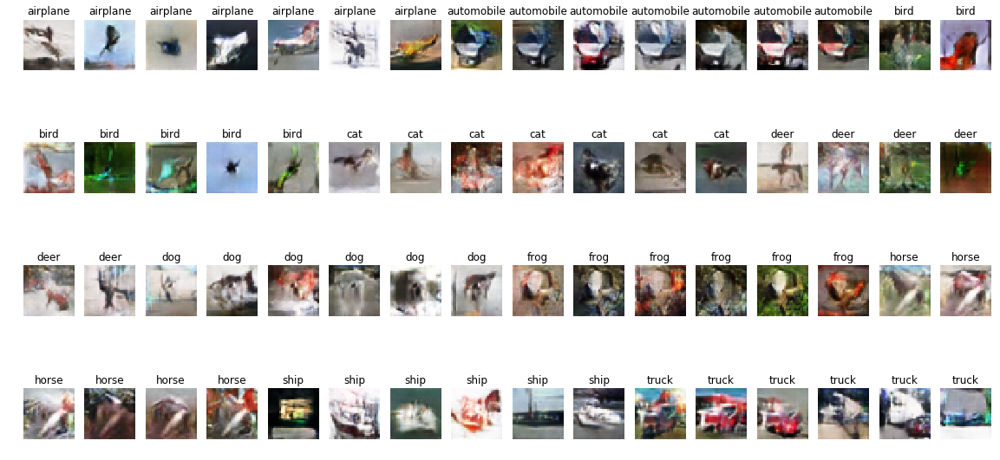

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 56.25%


100%|██████████| 2500/2500 [10:25<00:00,  4.00it/s]


epoch: 9 (22500) dLoss: 0.391664 gLoss: 1.92397 d_count: 5703 g_count: 17160
Tensor("generator_21/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


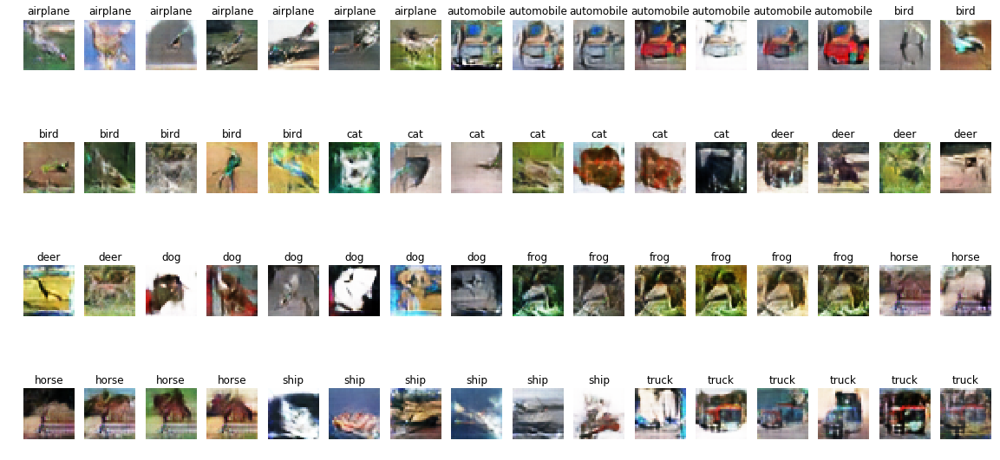

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 53.12%


100%|██████████| 2500/2500 [10:30<00:00,  3.96it/s]


epoch: 10 (25000) dLoss: 0.270087 gLoss: 5.19671 d_count: 5847 g_count: 17222
Tensor("generator_22/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


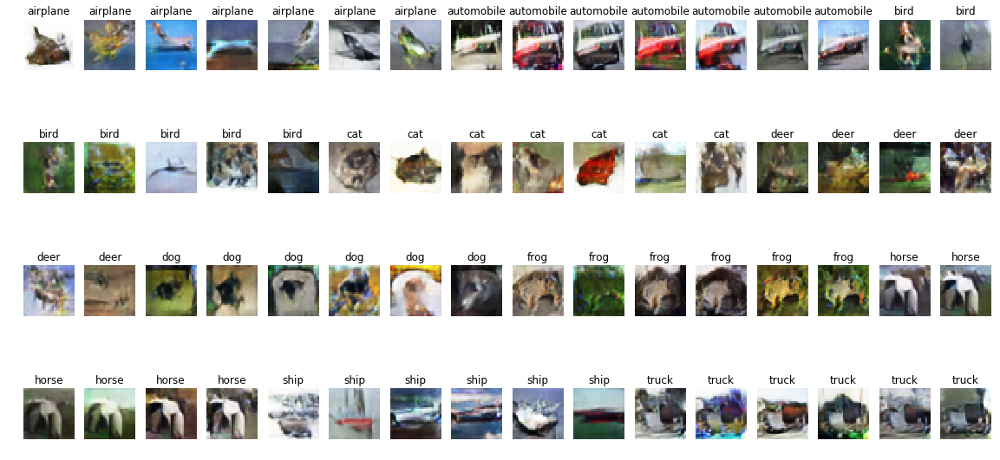

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 60.94%


100%|██████████| 2500/2500 [10:26<00:00,  3.99it/s]


epoch: 11 (27500) dLoss: 0.33856 gLoss: 2.75058 d_count: 5770 g_count: 17142
Tensor("generator_23/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


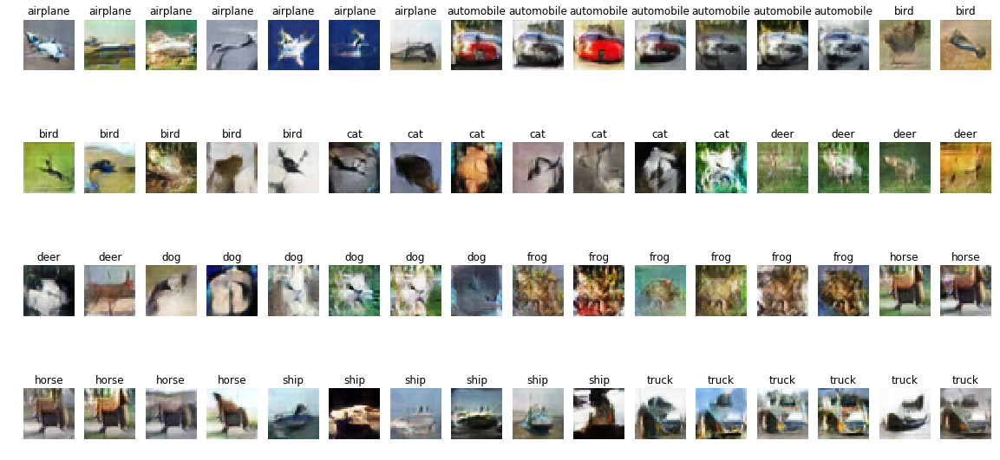

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 65.62%


100%|██████████| 2500/2500 [10:27<00:00,  3.99it/s]


epoch: 12 (30000) dLoss: 0.291142 gLoss: 2.83522 d_count: 5752 g_count: 17183
Tensor("generator_24/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


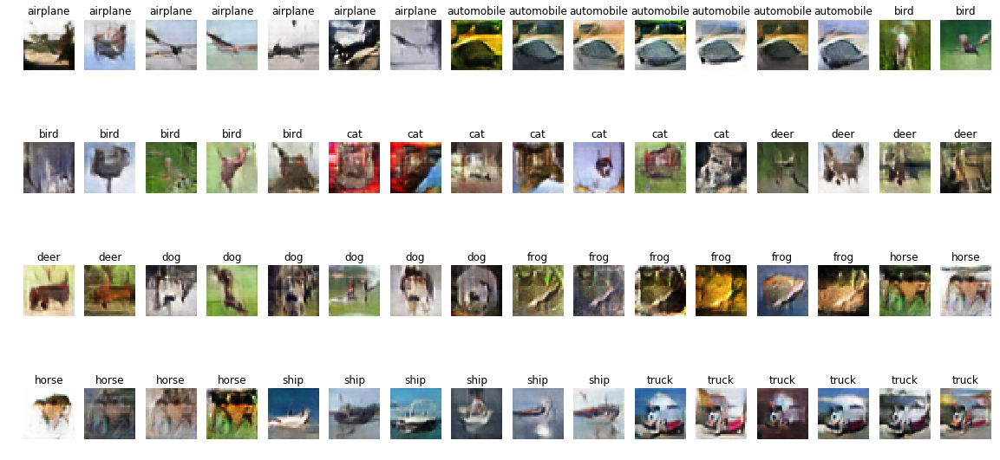

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 64.06%


100%|██████████| 2500/2500 [10:26<00:00,  3.99it/s]


epoch: 13 (32500) dLoss: 0.302243 gLoss: 2.30076 d_count: 5614 g_count: 17373
Tensor("generator_25/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


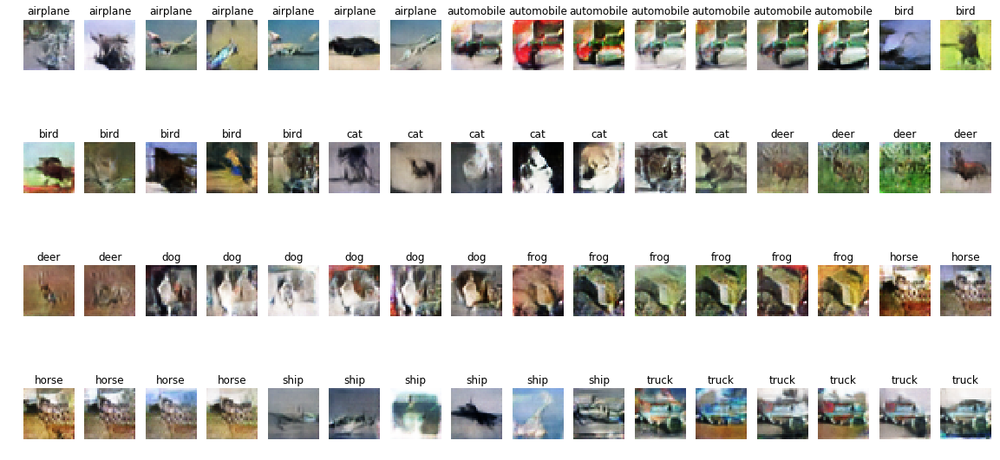

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 59.38%


100%|██████████| 2500/2500 [10:33<00:00,  3.95it/s]


epoch: 14 (35000) dLoss: 0.186876 gLoss: 2.87876 d_count: 5736 g_count: 17457
Tensor("generator_26/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


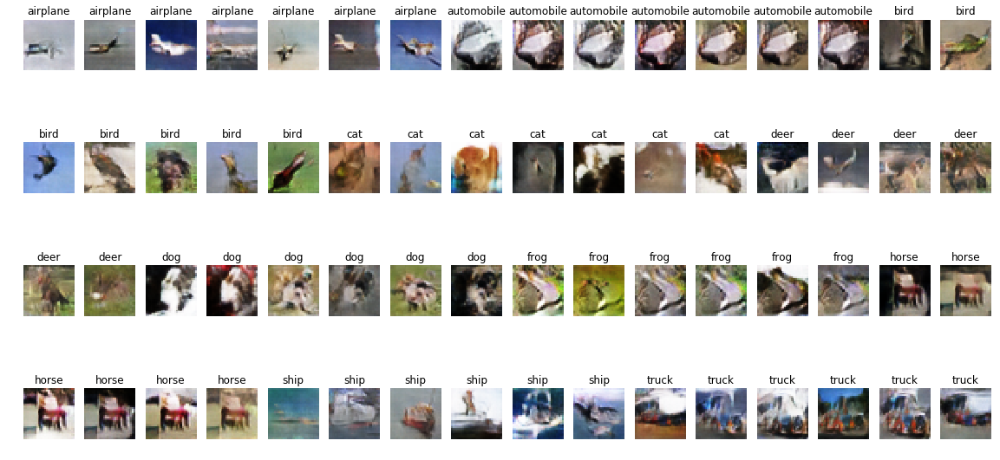

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 78.12%


100%|██████████| 2500/2500 [10:28<00:00,  3.98it/s]


epoch: 15 (37500) dLoss: 0.407997 gLoss: 1.8294 d_count: 5538 g_count: 17530
Tensor("generator_27/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


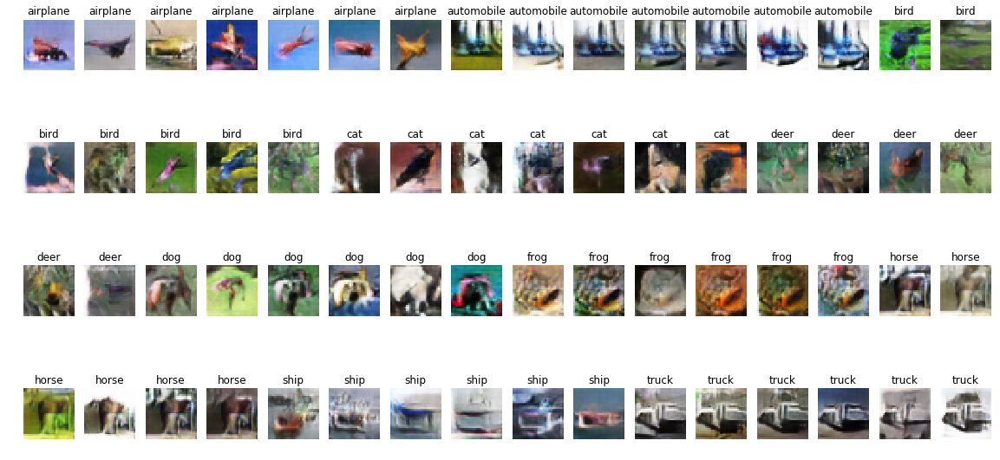

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 60.94%


100%|██████████| 2500/2500 [10:27<00:00,  3.99it/s]


epoch: 16 (40000) dLoss: 0.327824 gLoss: 3.11053 d_count: 5471 g_count: 17608
Tensor("generator_28/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


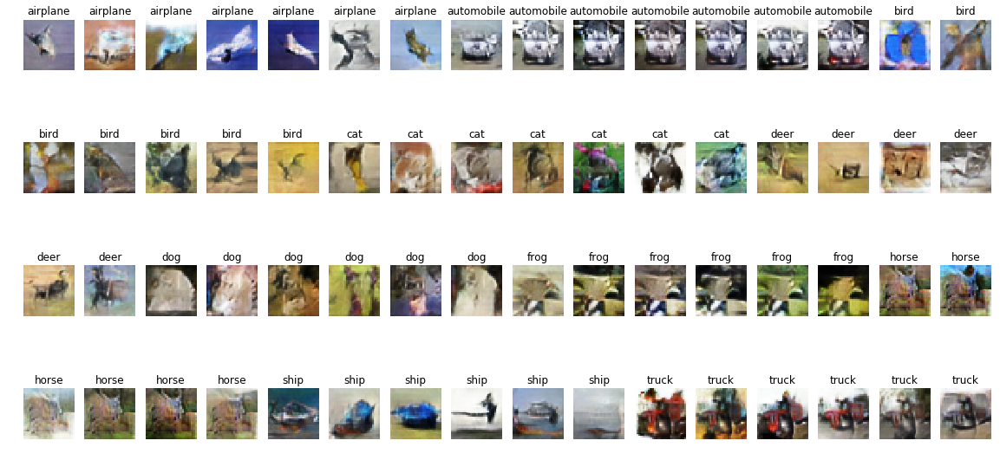

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 50.0%


100%|██████████| 2500/2500 [10:26<00:00,  3.99it/s]


epoch: 17 (42500) dLoss: 0.14781 gLoss: 4.15226 d_count: 5294 g_count: 17788
Tensor("generator_29/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


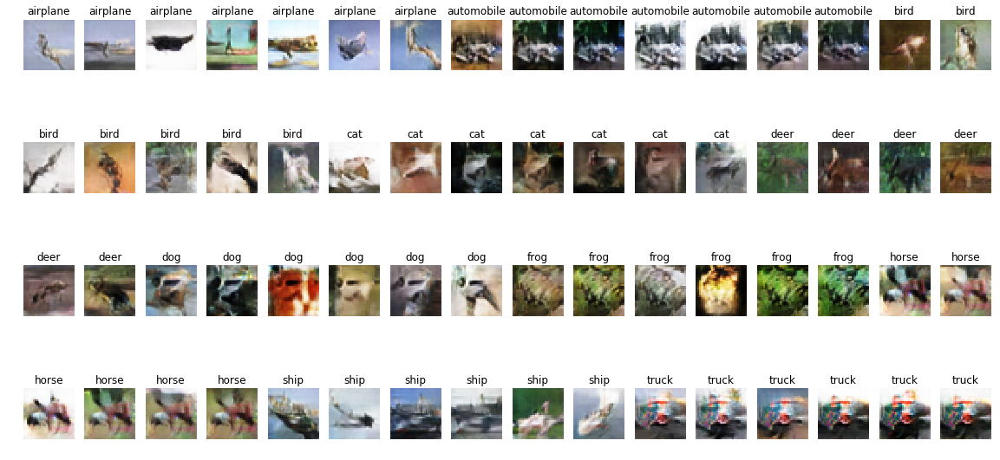

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 51.56%


100%|██████████| 2500/2500 [10:25<00:00,  4.00it/s]


epoch: 18 (45000) dLoss: 0.407596 gLoss: 2.39485 d_count: 5292 g_count: 17742
Tensor("generator_30/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


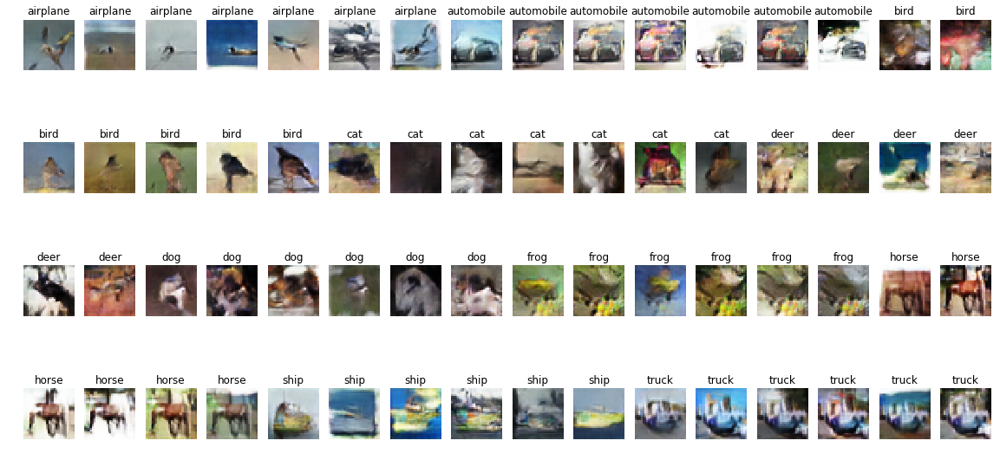

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 65.62%


100%|██████████| 2500/2500 [10:28<00:00,  3.98it/s]


epoch: 19 (47500) dLoss: 0.320297 gLoss: 3.69086 d_count: 5215 g_count: 17955
Tensor("generator_31/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


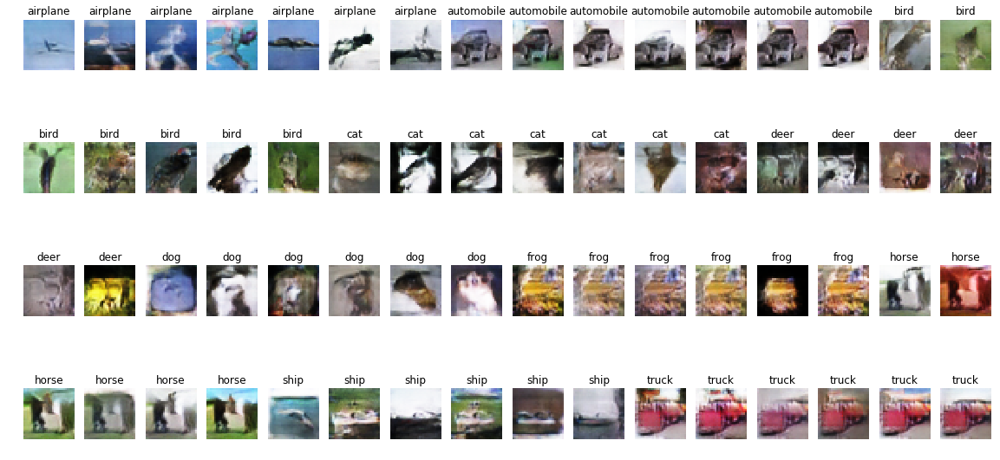

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 60.94%


100%|██████████| 2500/2500 [10:18<00:00,  4.04it/s]


epoch: 20 (50000) dLoss: 0.446714 gLoss: 2.04979 d_count: 5036 g_count: 17846
Tensor("generator_32/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


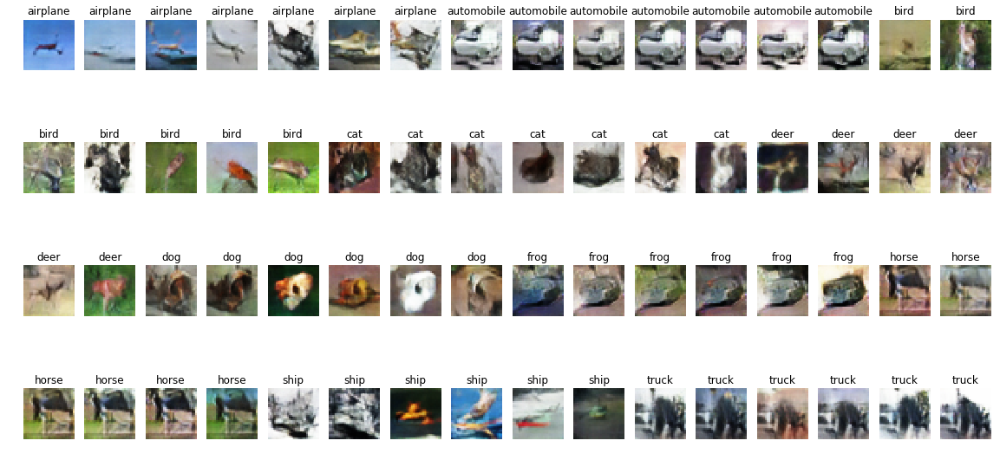

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 71.88%


100%|██████████| 2500/2500 [10:25<00:00,  4.00it/s]


epoch: 21 (52500) dLoss: 0.352798 gLoss: 2.90011 d_count: 5006 g_count: 18138
Tensor("generator_33/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


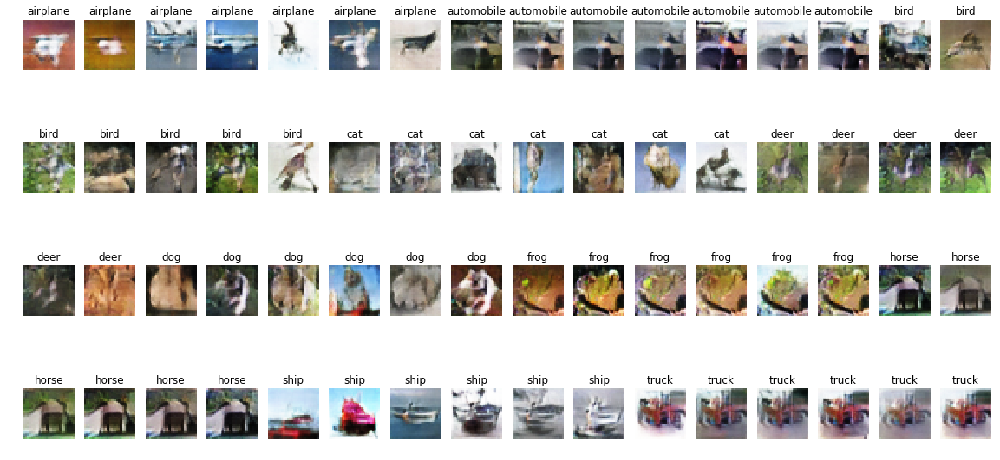

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 50.0%


100%|██████████| 2500/2500 [10:20<00:00,  4.03it/s]


epoch: 22 (55000) dLoss: 0.200215 gLoss: 3.96364 d_count: 4845 g_count: 18179
Tensor("generator_34/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


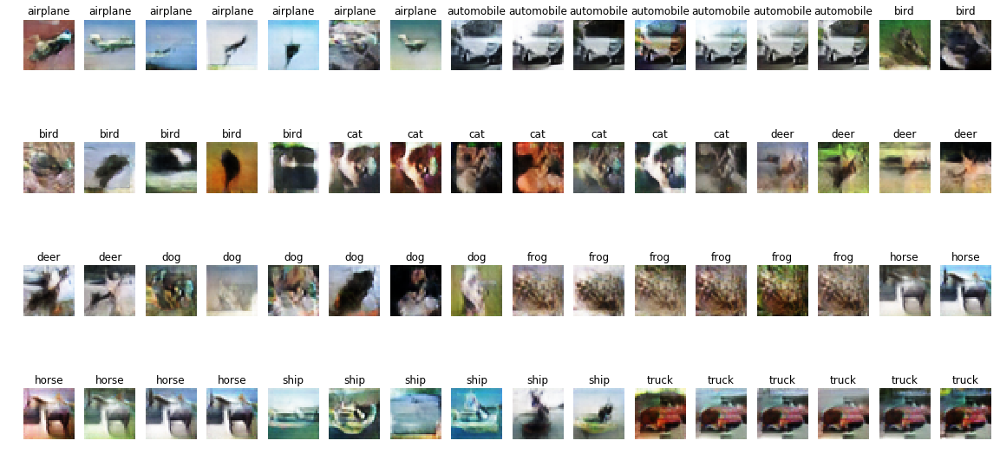

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 64.06%


100%|██████████| 2500/2500 [10:19<00:00,  4.04it/s]


epoch: 23 (57500) dLoss: 0.313252 gLoss: 2.95744 d_count: 4692 g_count: 18298
Tensor("generator_35/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


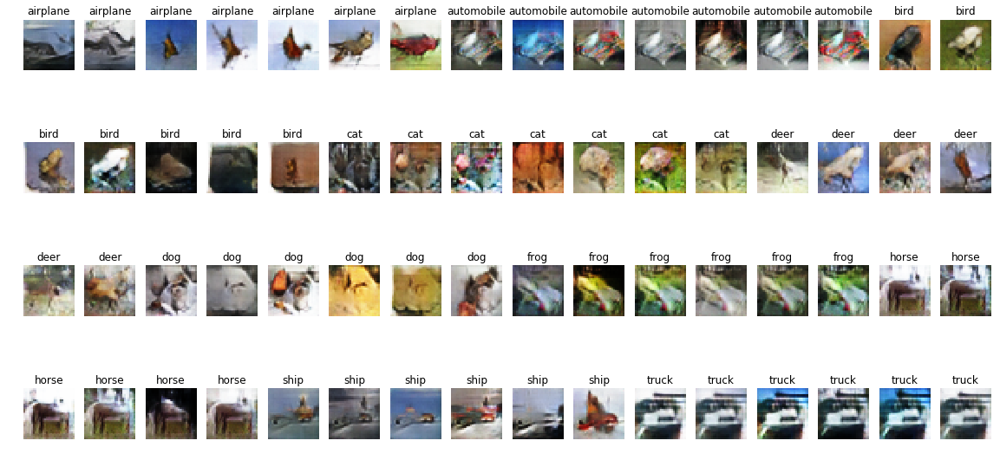

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 37.5%


100%|██████████| 2500/2500 [10:18<00:00,  4.04it/s]


epoch: 24 (60000) dLoss: 0.134486 gLoss: 3.52333 d_count: 4739 g_count: 18234
Tensor("generator_36/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


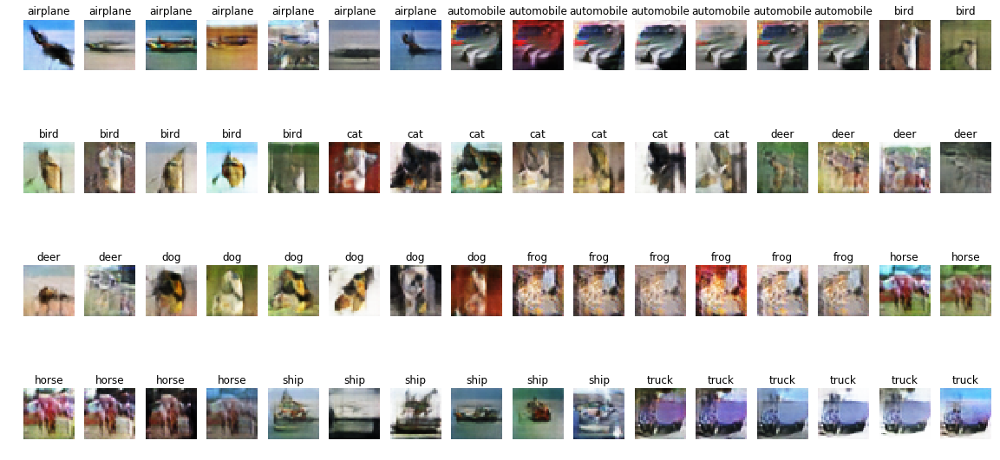

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 67.19%


100%|██████████| 2500/2500 [10:20<00:00,  4.03it/s]


epoch: 25 (62500) dLoss: 0.368689 gLoss: 3.54349 d_count: 4724 g_count: 18308
Tensor("generator_37/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


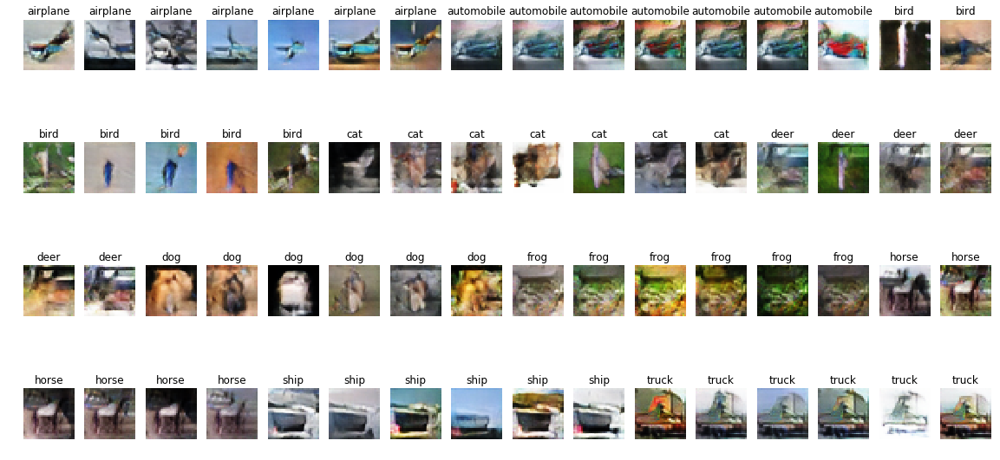

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 73.44%


100%|██████████| 2500/2500 [10:15<00:00,  4.06it/s]


epoch: 26 (65000) dLoss: 0.15559 gLoss: 1.86168 d_count: 4477 g_count: 18465
Tensor("generator_38/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


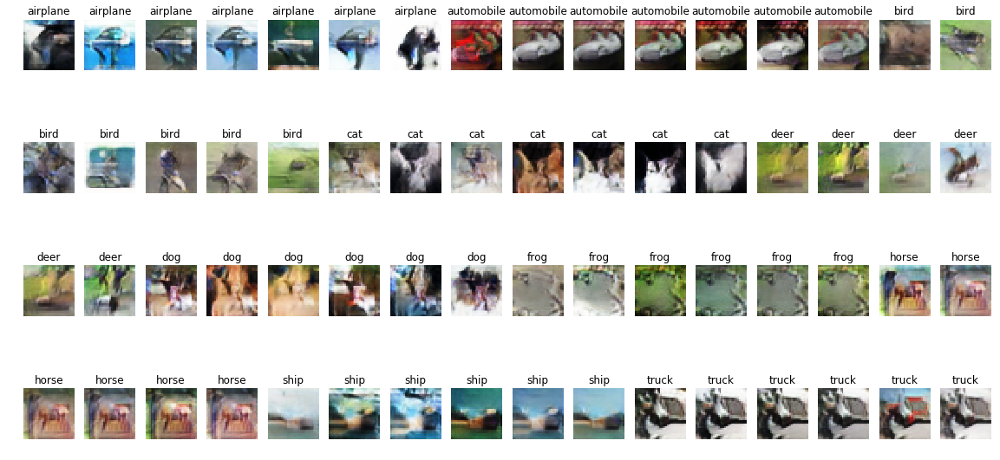

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 51.56%


100%|██████████| 2500/2500 [10:13<00:00,  4.07it/s]


epoch: 27 (67500) dLoss: 0.187132 gLoss: 4.22183 d_count: 4394 g_count: 18491
Tensor("generator_39/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


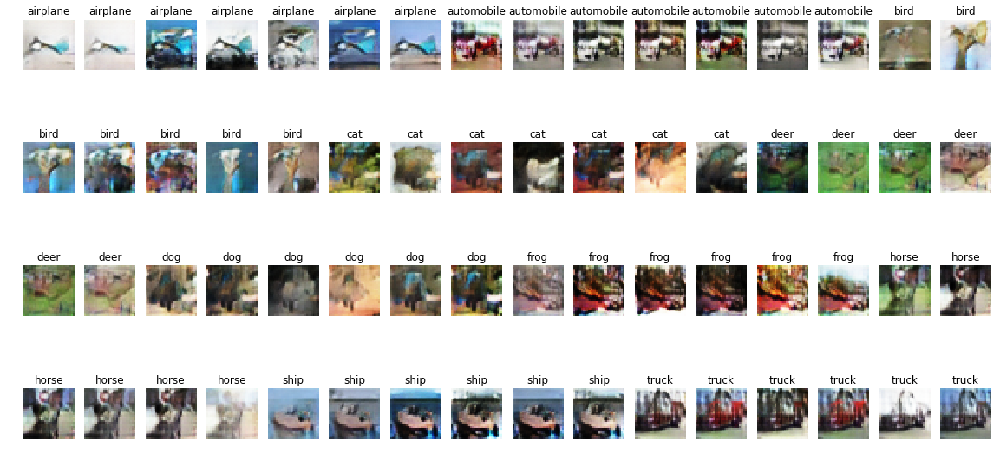

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 57.81%


100%|██████████| 2500/2500 [10:14<00:00,  4.07it/s]


epoch: 28 (70000) dLoss: 0.286497 gLoss: 2.33966 d_count: 4404 g_count: 18480
Tensor("generator_40/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


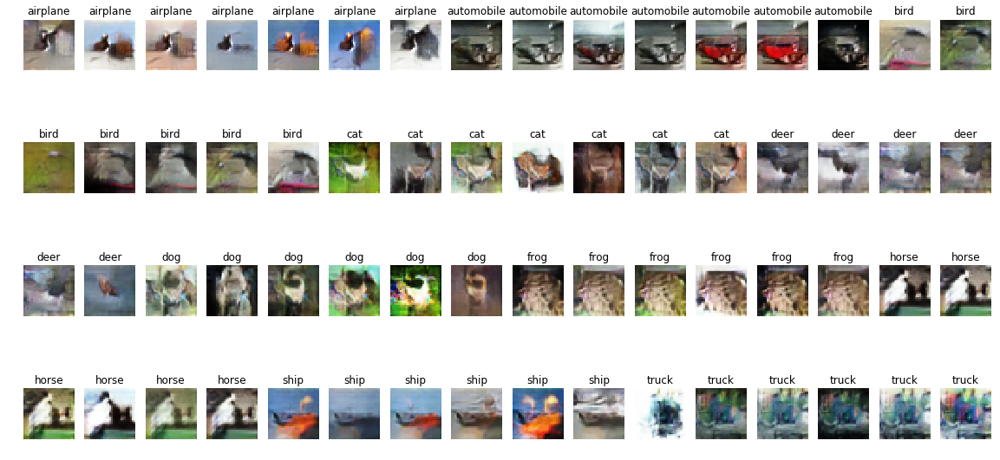

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 59.38%


100%|██████████| 2500/2500 [10:15<00:00,  4.06it/s]


epoch: 29 (72500) dLoss: 0.274301 gLoss: 3.81841 d_count: 4364 g_count: 18598
Tensor("generator_41/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


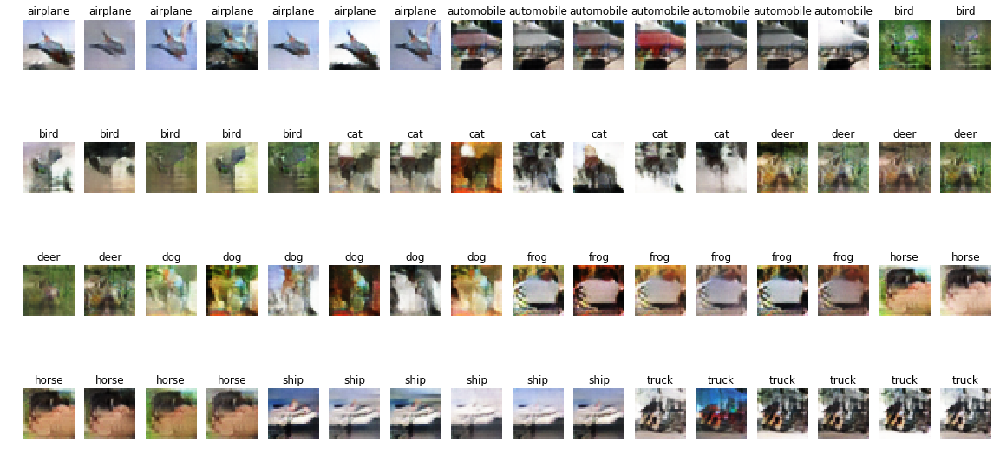

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 48.44%


100%|██████████| 2500/2500 [10:10<00:00,  4.09it/s]


epoch: 30 (75000) dLoss: 0.258373 gLoss: 2.56472 d_count: 4230 g_count: 18603
Tensor("generator_42/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


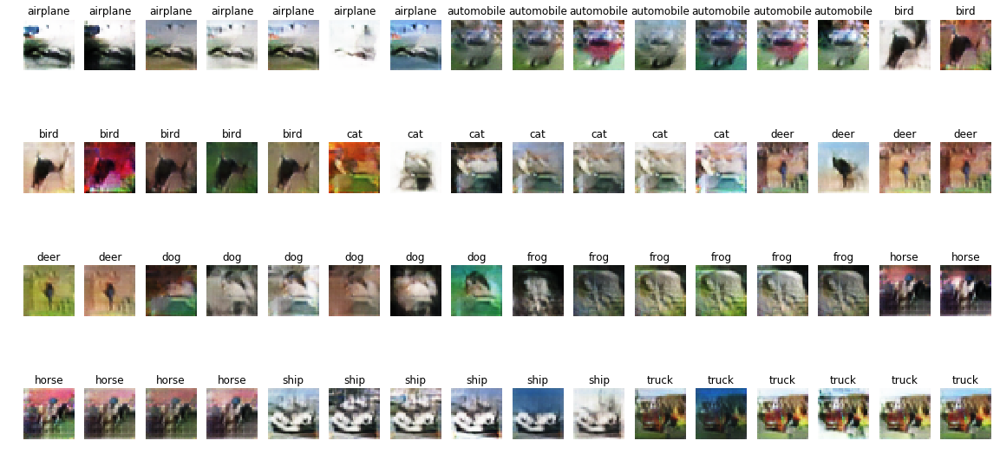

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 53.12%


100%|██████████| 2500/2500 [10:09<00:00,  4.10it/s]


epoch: 31 (77500) dLoss: 0.227206 gLoss: 3.96321 d_count: 4265 g_count: 18510
Tensor("generator_43/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


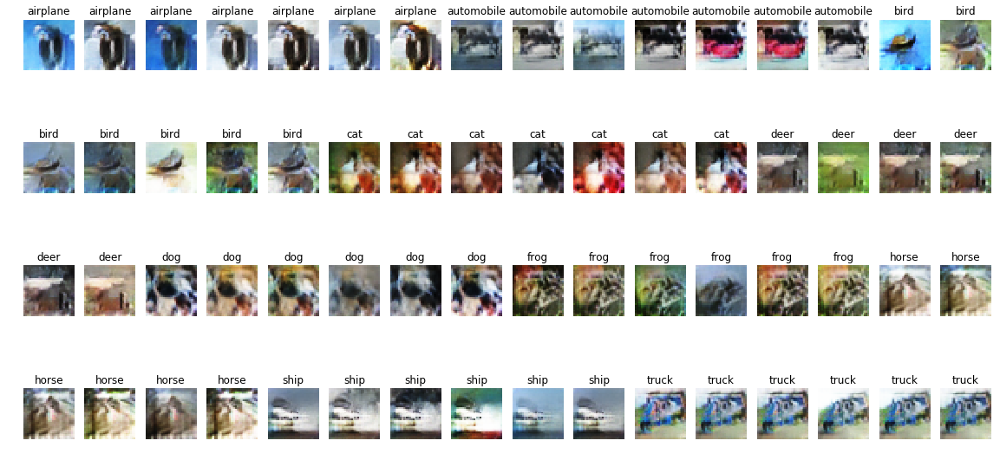

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 54.69%


100%|██████████| 2500/2500 [10:13<00:00,  4.08it/s]


epoch: 32 (80000) dLoss: 0.335933 gLoss: 2.29395 d_count: 4264 g_count: 18634
Tensor("generator_44/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


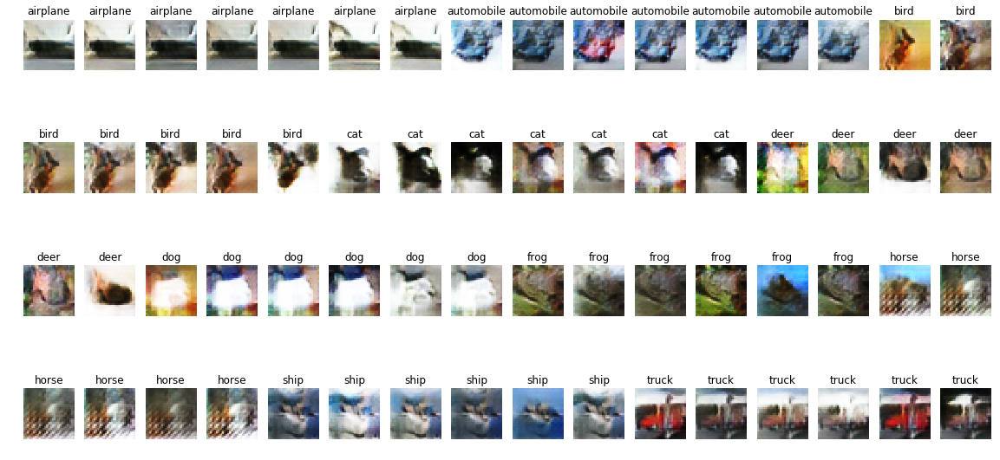

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 53.12%


100%|██████████| 2500/2500 [10:13<00:00,  4.08it/s]


epoch: 33 (82500) dLoss: 0.328722 gLoss: 3.15354 d_count: 4242 g_count: 18673
Tensor("generator_45/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


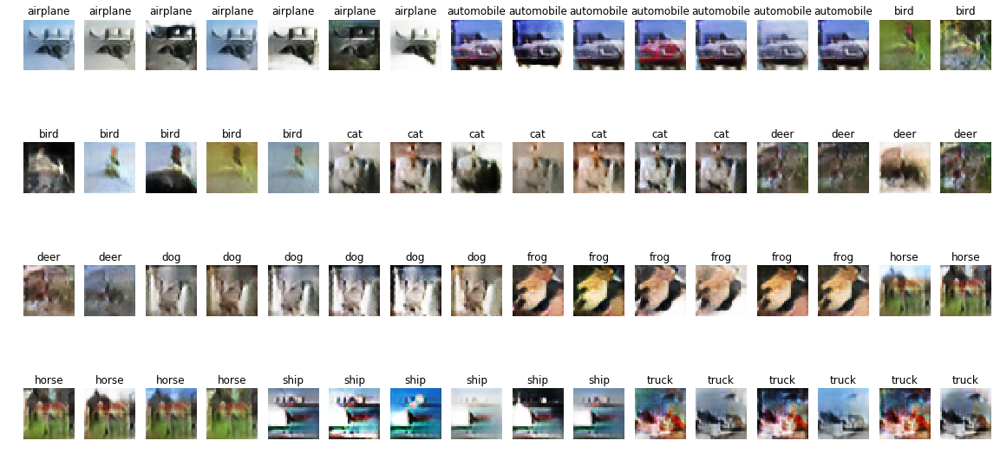

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 48.44%


100%|██████████| 2500/2500 [10:10<00:00,  4.09it/s]


epoch: 34 (85000) dLoss: 0.15728 gLoss: 2.54652 d_count: 4227 g_count: 18625
Tensor("generator_46/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


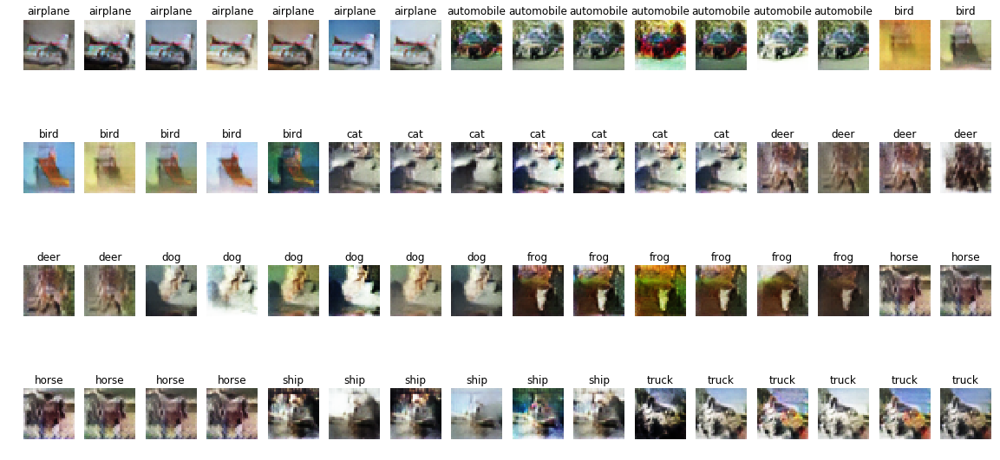

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 48.44%


100%|██████████| 2500/2500 [10:10<00:00,  4.10it/s]


epoch: 35 (87500) dLoss: 0.44412 gLoss: 4.56333 d_count: 4247 g_count: 18558
Tensor("generator_47/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


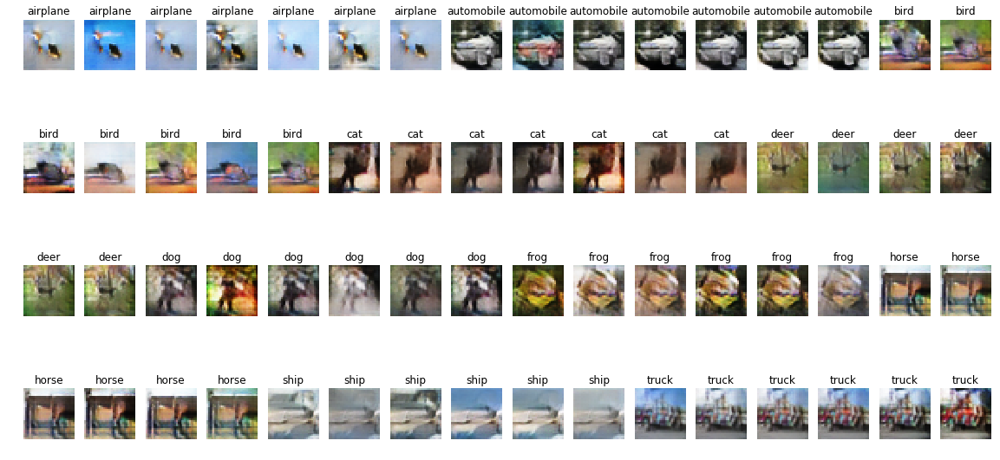

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 73.44%


100%|██████████| 2500/2500 [10:08<00:00,  4.11it/s]


epoch: 36 (90000) dLoss: 0.140386 gLoss: 3.05701 d_count: 4225 g_count: 18484
Tensor("generator_48/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


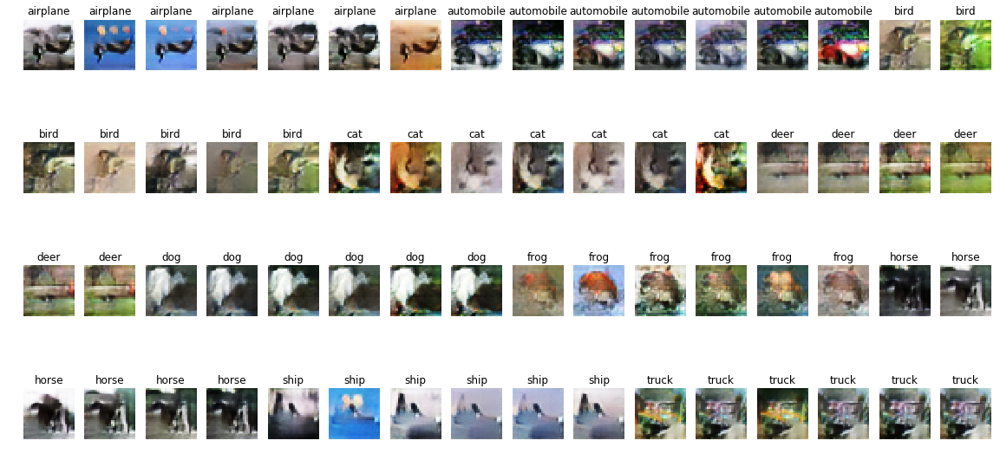

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 53.12%


100%|██████████| 2500/2500 [10:08<00:00,  4.11it/s]


epoch: 37 (92500) dLoss: 0.10483 gLoss: 3.45776 d_count: 4355 g_count: 18340
Tensor("generator_49/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


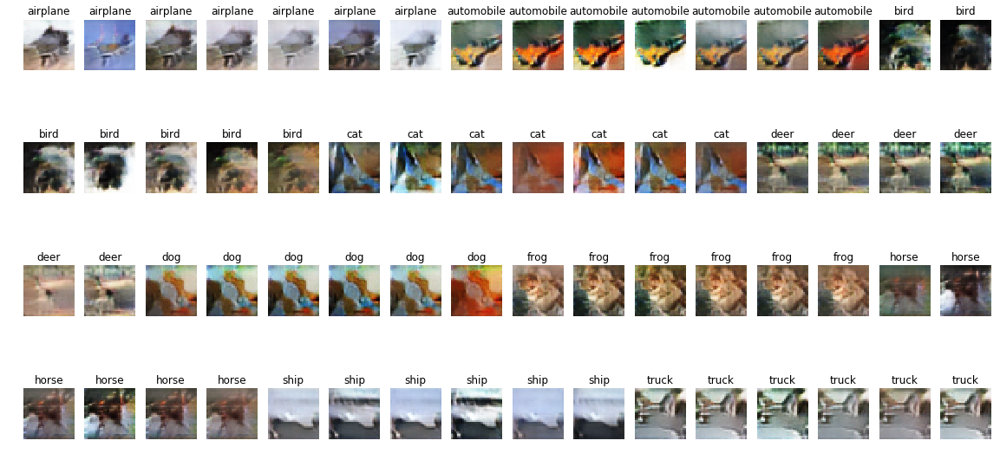

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 43.75%


100%|██████████| 2500/2500 [10:07<00:00,  4.12it/s]


epoch: 38 (95000) dLoss: 0.400006 gLoss: 2.26643 d_count: 4266 g_count: 18402
Tensor("generator_50/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


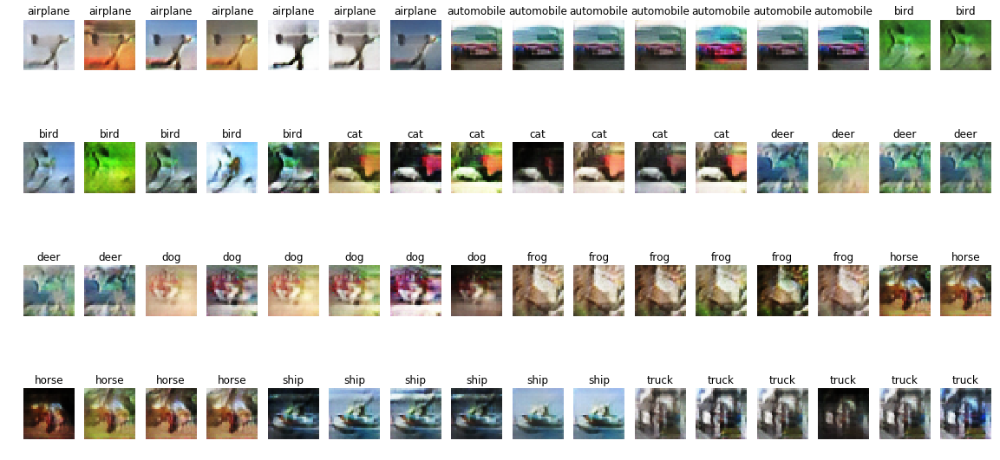

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 31.25%


100%|██████████| 2500/2500 [10:10<00:00,  4.09it/s]


epoch: 39 (97500) dLoss: 0.260569 gLoss: 4.095 d_count: 4253 g_count: 18558
Tensor("generator_51/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


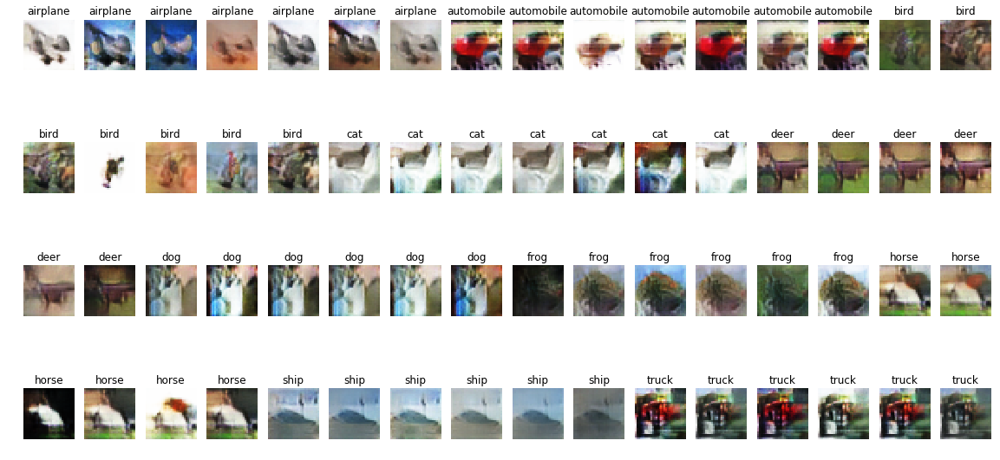

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 60.94%


100%|██████████| 2500/2500 [10:07<00:00,  4.12it/s]


epoch: 40 (100000) dLoss: 0.438443 gLoss: 3.45261 d_count: 4165 g_count: 18568
Tensor("generator_52/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


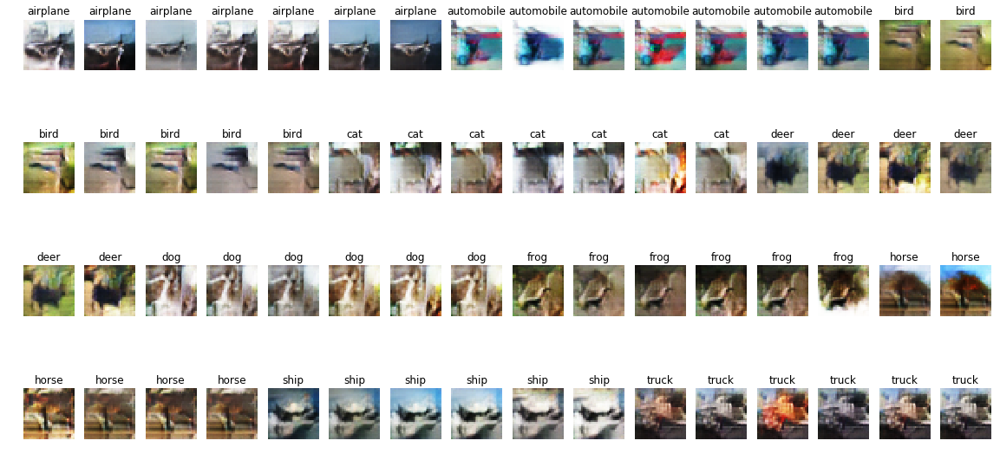

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 54.69%


100%|██████████| 2500/2500 [10:07<00:00,  4.12it/s]


epoch: 41 (102500) dLoss: 0.324844 gLoss: 1.22476 d_count: 4233 g_count: 18446
Tensor("generator_53/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


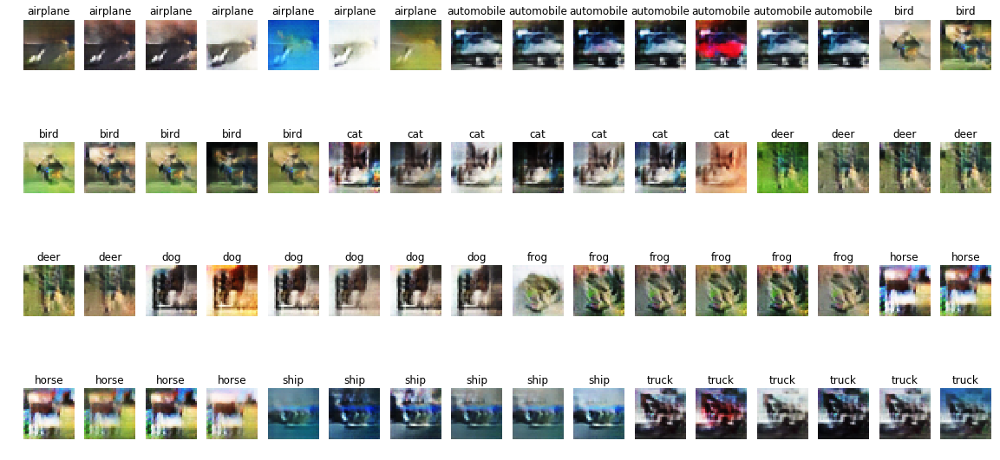

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 71.88%


100%|██████████| 2500/2500 [10:09<00:00,  4.10it/s]


epoch: 42 (105000) dLoss: 0.383752 gLoss: 2.4555 d_count: 4270 g_count: 18492
Tensor("generator_54/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


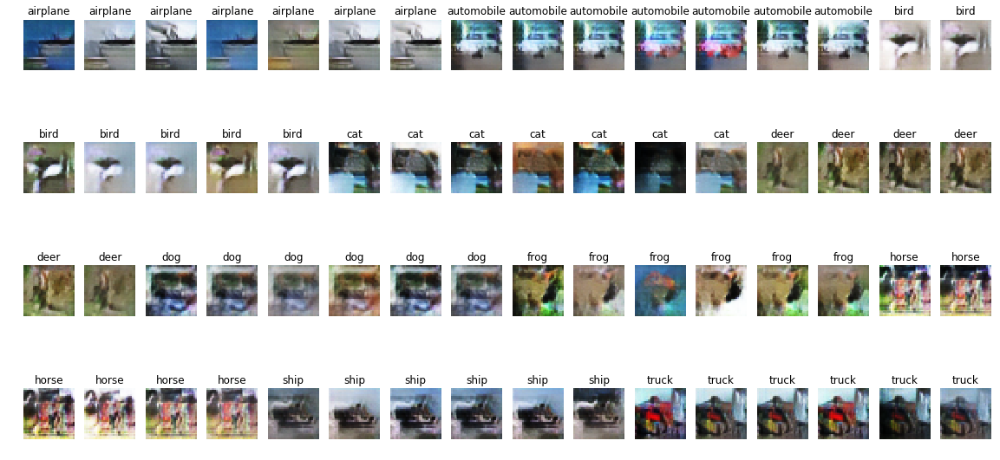

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 34.38%


100%|██████████| 2500/2500 [10:10<00:00,  4.10it/s]


epoch: 43 (107500) dLoss: 0.426342 gLoss: 1.86207 d_count: 4223 g_count: 18576
Tensor("generator_55/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


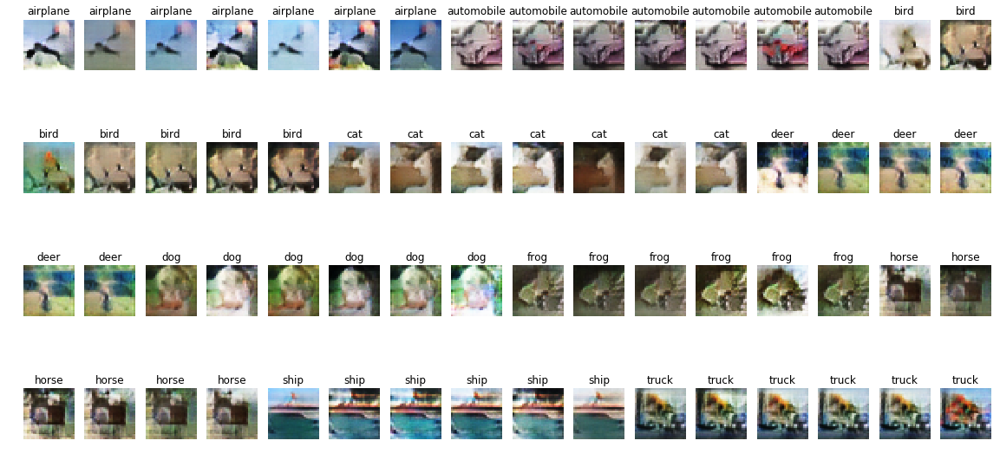

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 70.31%


100%|██████████| 2500/2500 [10:09<00:00,  4.10it/s]


epoch: 44 (110000) dLoss: 0.156996 gLoss: 3.04159 d_count: 4274 g_count: 18485
Tensor("generator_56/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


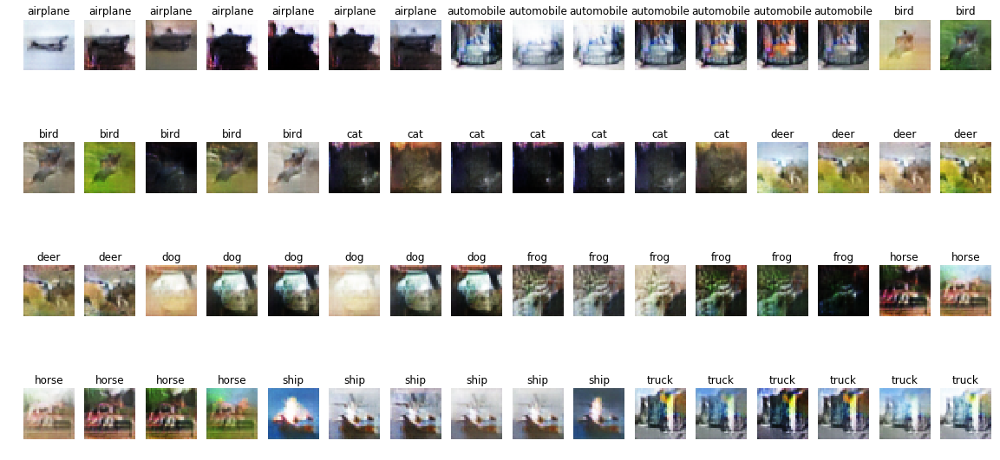

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 40.62%


100%|██████████| 2500/2500 [10:05<00:00,  4.13it/s]


epoch: 45 (112500) dLoss: 0.129999 gLoss: 3.54101 d_count: 4236 g_count: 18372
Tensor("generator_57/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


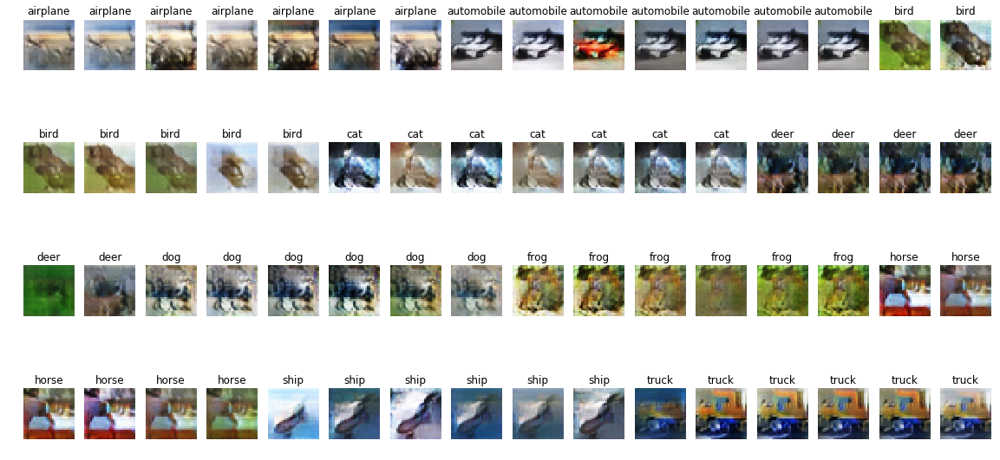

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 34.38%


100%|██████████| 2500/2500 [10:16<00:00,  4.06it/s]


epoch: 46 (115000) dLoss: 0.427656 gLoss: 1.40228 d_count: 4123 g_count: 18386
Tensor("generator_58/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


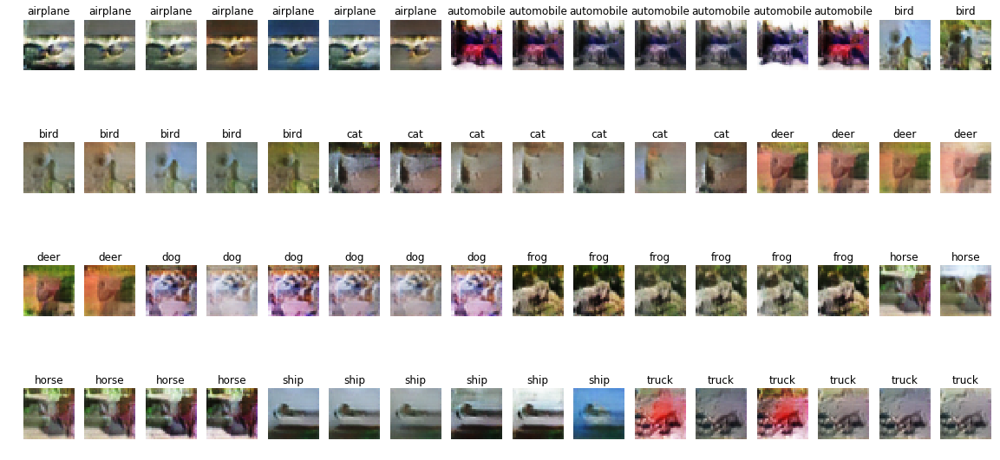

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 35.94%


100%|██████████| 2500/2500 [10:05<00:00,  4.13it/s]


epoch: 47 (117500) dLoss: 0.278032 gLoss: 3.48622 d_count: 4250 g_count: 18411
Tensor("generator_59/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


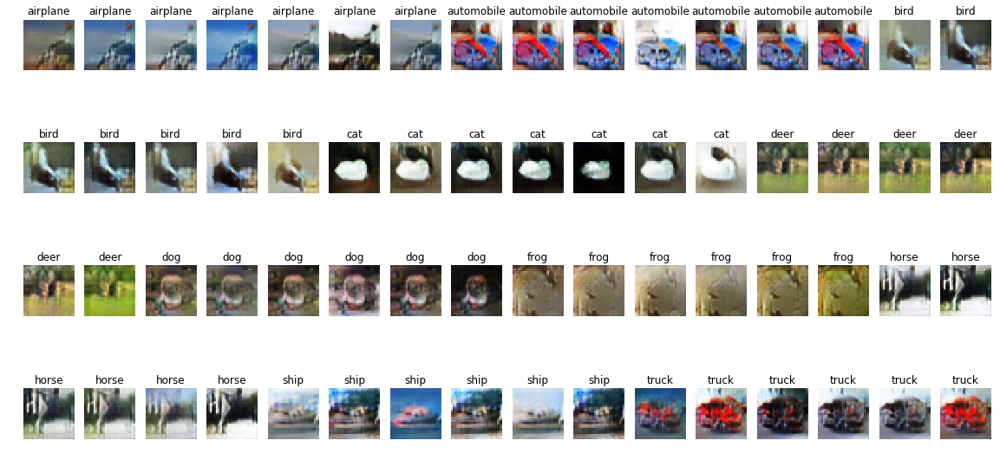

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 71.88%


100%|██████████| 2500/2500 [10:06<00:00,  4.12it/s]


epoch: 48 (120000) dLoss: 0.308837 gLoss: 4.49739 d_count: 4166 g_count: 18526
Tensor("generator_60/Squeeze_1:0", shape=(64, 64, 64, 3), dtype=float32)


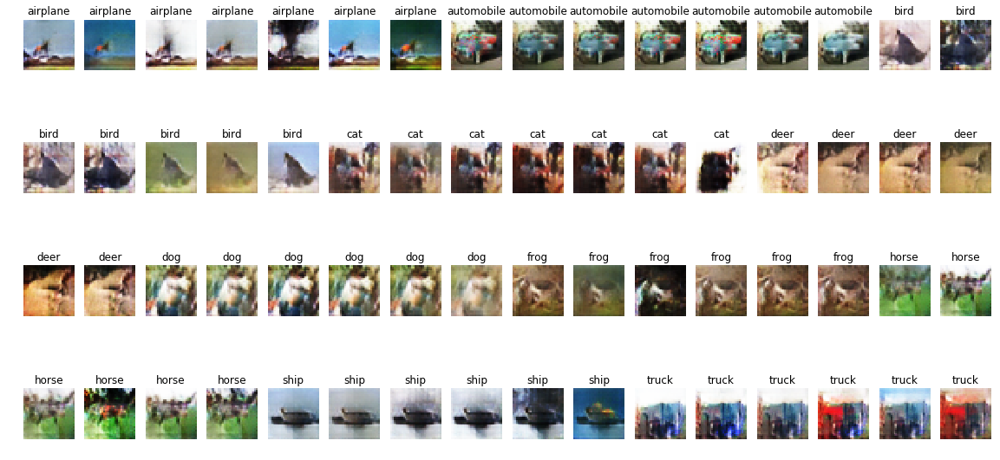

  0%|          | 0/2500 [00:00<?, ?it/s]

Quality: 50.0%


 11%|█         | 268/2500 [01:05<09:09,  4.07it/s]

KeyboardInterrupt: 

In [23]:
LABELS = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

def display_images(imgs, labels, width, height):
    #print(imgs.shape)
    imgs = (imgs + 1.0) / 2.0
    fig, axes= plt.subplots(height, width, figsize=(20,10))
    
    for i in range(height):
        for j in range(width):
            data = imgs[i*width+j,:,:,:]

            axes[i, j].imshow(data, cmap=plt.cm.hot)
            axes[i, j].set_title(LABELS[labels[i*width+j]])
            axes[i, j].axis("off")
#     figure.subplots_adjust(hspace=1.5)
    
    plt.show()
    
def get_labels():
    res = np.zeros(shape = [BATCH_SIZE, LABEL_SIZE])
    res[range(BATCH_SIZE),np.random.randint(0, LABEL_SIZE, size = BATCH_SIZE)] += 1
    return res

def get_noise():
    return np.random.uniform(-1., 1., size=[BATCH_SIZE, NOISE_SIZE]) 



arr = [0]*BATCH_SIZE
for i in range(BATCH_SIZE):
    arr[i] = i%10
arr.sort()
lab2 = np.zeros(shape = [BATCH_SIZE, LABEL_SIZE])
lab2[range(BATCH_SIZE),arr] = 1


sess = tf.Session()

sess.run(init)

# Restore state of CIFAR10 classificator (87.24)

saver.restore(sess, "../00-convnet/0.872400-99.ckpt")


gLoss = 0
dLossFake, dLossReal, dLoss = 1, 1, 1
d_fake_count, d_real_count, g_count = 0, 0, 0

# display sample data
print('CIFAR10 samples:')
batch_x, batch_y = get_data()
display_images(batch_x, np.argmax(batch_y, axis=1), 16, 4)

# Test accuracty with resnet
acc, pred, _, _ = sess.run([accuracy, prediction, test_inputs, test_labels], {test_inputs: batch_x, test_labels: np.argmax(batch_y, axis=1)})
print('quality:',acc)

STEP_PER_EPOCH = 500

for epoch in range(1, 100):
    d_count = g_count = 0
    for step in tqdm(range(0, STEP_PER_EPOCH)): 
        for i in range(5):
            batch_x, batch_y = get_data()
            _, dLoss = sess.run([d_trainer, disc_loss], {
                labels: batch_y,
                is_training: True,
                noise: get_noise(),
                images: batch_x
            })
            d_count += 1
            if dLoss < 0.45: break
        ile = 3 + (5 if 5*dLoss < gLoss else 0)
        for i in range(ile):
            batch_x, batch_y = get_data()
            _, gLoss = sess.run([g_trainer, gen_loss], {
                noise: get_noise(),
                labels: get_labels(),
                is_training: True,
            })
            g_count += 1
            if gLoss < 0.7: break

    print('epoch:', epoch, '('+str(epoch*STEP_PER_EPOCH)+')', 'dLoss:', dLoss, 'gLoss:', gLoss, 'd_count:', d_count, 'g_count:', g_count)
    
    imgs, = sess.run([generator(noise, labels)], {
        noise: get_noise(),
        labels: lab2,
        is_training: False,
    })
    
    display_images(imgs, np.argmax(lab2, axis=1), 16, 4)
    
    acc = sess.run([accuracy], {test_inputs: imgs, test_labels: arr})
    print('Quality:', str(round(100.0*acc[0], 2))+'%')
#     hist, bins = np.histogram(imgs, bins=50)
#     width = 0.7 * (bins[1] - bins[0])
#     center = (bins[:-1] + bins[1:]) / 2
#     plt.bar(center, hist, align='center', width=width)
#     plt.show()

